In [1]:
### Data Science Libraries ###
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px


### Machine Learning Libraries ###
 
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.inspection import permutation_importance
import catboost as cb
import lightgbm as lgbm
import xgboost as xgb
from sklearn.preprocessing import LabelEncoder
from prophet import Prophet

### OS and other Libraries ###
import inspect
import os
import datetime
import warnings
warnings.filterwarnings("ignore")
import random
import pickle
from tqdm import tqdm

C:\Users\renatocastro\anaconda3\envs\machinelearning\lib\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


In [2]:
train = pd.read_csv('..\\dataset\\train\\train_converted.csv')
test = pd.read_csv('..\\dataset\\test\\test_converted.csv')

In [3]:
descriptive_columns = ['Z_MARCA', 'Z_GAMA', 'Z_MODELO',
                       'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA']

# EDA #

In [4]:
train

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_01,0,2021-05-17,17,5,2021
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_01,0,2021-05-17,17,5,2021
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_01,1,2021-05-17,17,5,2021
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_01,0,2021-05-17,17,5,2021
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_01,0,2021-05-17,17,5,2021
...,...,...,...,...,...,...,...,...,...,...,...
2358645,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_50,0,2022-04-25,25,4,2022
2358646,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_50,0,2022-04-25,25,4,2022
2358647,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_50,0,2022-04-25,25,4,2022
2358648,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_50,0,2022-04-25,25,4,2022


In [5]:
train.describe(include='all')

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR
count,2358650,2358650,2358650,2358650,2358650,2358650,2.358650e+06,2358650,2.358650e+06,2.358650e+06,2.358650e+06
unique,17,7,318,25,486,50,NaN,50,NaN,NaN,NaN
top,MAR_1,GAM_1,MOD_1,DEP_1,PVENT_1,SEMANA_01,NaN,2021-05-17,NaN,NaN,NaN
freq,594400,1039250,24050,1023750,12400,47173,NaN,47173,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,7.622398e-01,NaN,1.664000e+01,6.540000e+00,2.021340e+03
std,NaN,NaN,NaN,NaN,NaN,NaN,5.983817e+00,NaN,8.668935e+00,3.528230e+00,4.737089e-01
min,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,1.000000e+00,1.000000e+00,2.021000e+03
25%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,9.000000e+00,3.000000e+00,2.021000e+03
50%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,1.700000e+01,7.000000e+00,2.021000e+03
75%,NaN,NaN,NaN,NaN,NaN,NaN,0.000000e+00,NaN,2.400000e+01,1.000000e+01,2.022000e+03


In [6]:
test.describe(include='all')

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR
count,471730,471730,471730,471730,471730,471730,0.0,471730,471730.000000,471730.000000,471730.0
unique,17,7,318,25,486,10,NaN,10,NaN,NaN,NaN
top,MAR_1,GAM_1,MOD_1,DEP_1,PVENT_1,SEMANA_51,NaN,2022-05-02,NaN,NaN,NaN
freq,118880,207850,4810,204750,2480,47173,NaN,47173,NaN,NaN,NaN
mean,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,15.000000,5.600000,2022.0
std,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,9.327389,0.663326,0.0
min,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.000000,5.000000,2022.0
25%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,5.000000,2022.0
50%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,14.500000,5.500000,2022.0
75%,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,23.000000,6.000000,2022.0


<AxesSubplot:xlabel='Demanda', ylabel='Density'>

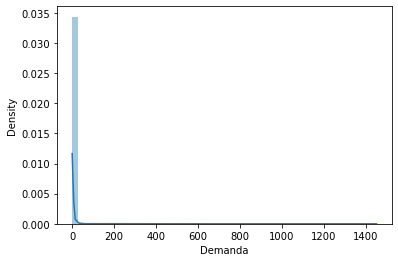

In [6]:
sns.distplot(train.Demanda)

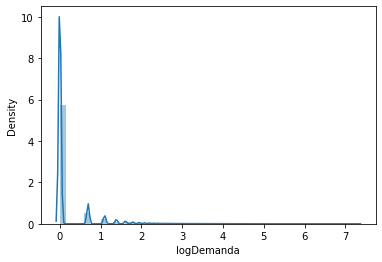

In [7]:
train['logDemanda'] = np.log1p(train['Demanda'])
sns.distplot(train['logDemanda'] )
train.drop('logDemanda', axis = 1, inplace = True)

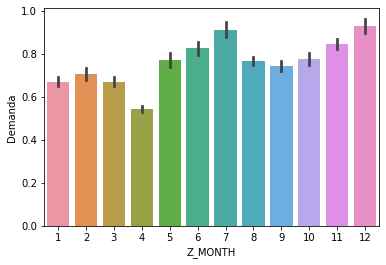

In [8]:
g = sns.barplot(data = train, x=train['Z_MONTH'], y=train['Demanda'])
plt.show()#g.set_xticklabels('Z_MONTH', rotation = 90)

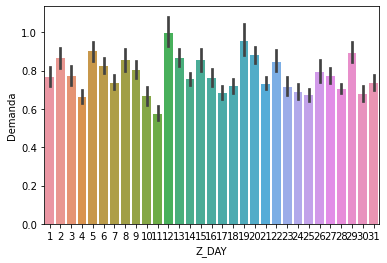

In [9]:
g = sns.barplot(data = train, x=train['Z_DAY'], y=train['Demanda'])
plt.show()

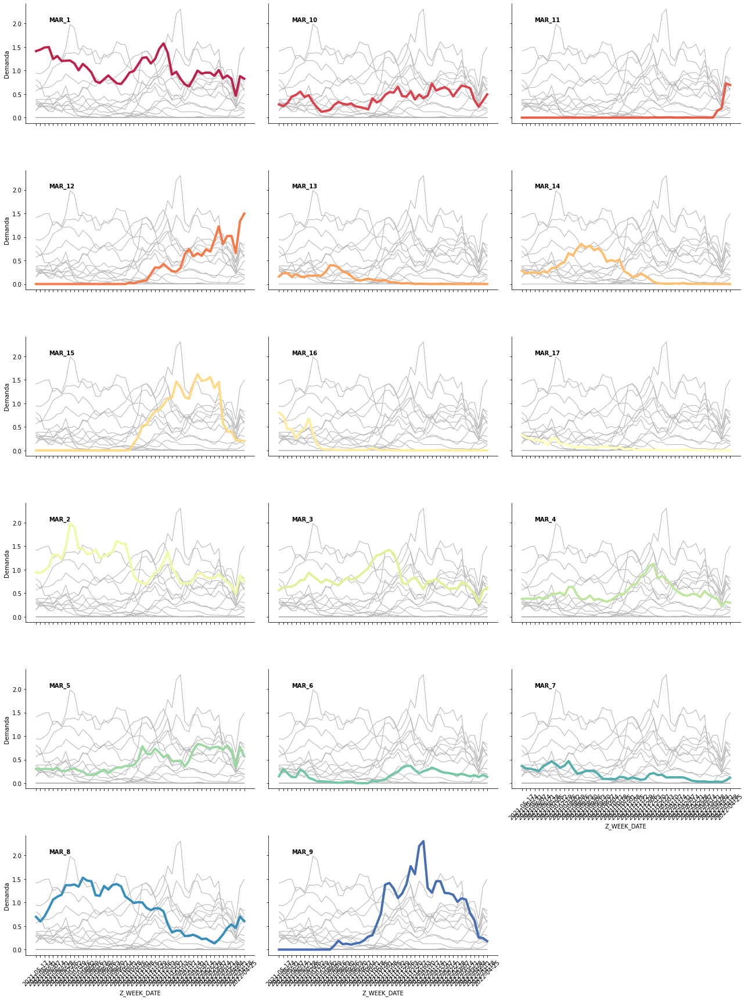

In [10]:
aux = train[['Z_MARCA', 'Demanda', 'Z_WEEK_DATE']].groupby(['Z_MARCA', 'Z_WEEK_DATE']).mean()
aux = aux[aux['Demanda'].notna()].reset_index()


g = sns.relplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda",
                col = "Z_MARCA", hue = "Z_MARCA",
                kind = "line", palette = "Spectral",   
                linewidth = 4, zorder = 5,
                col_wrap = 3, height = 4, aspect = 1.5, legend = False
               )

#add text and silhouettes
for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight="bold"
           )
    sns.lineplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda", units="Z_MARCA",
                 estimator = None, color= ".7", linewidth=1, ax=ax
                )

#ax.set_xticks('Z_WEEK_DATE', rotation = 90)
g.set_titles("")
g.set_axis_labels("Z_WEEK_DATE", "Demanda")
g.set_xticklabels(ax.get_xticklabels(),rotation = 45)
g.tight_layout()

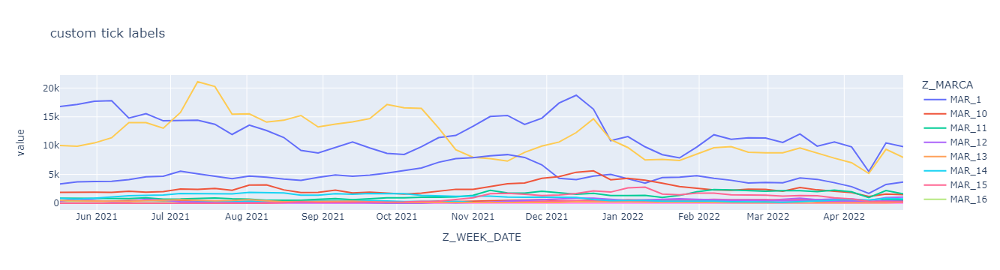

In [12]:
aux_ = pd.pivot_table(aux, index = 'Z_WEEK_DATE', values='Demanda', columns='Z_MARCA').reset_index()


fig = px.line(aux_, x='Z_WEEK_DATE', y=aux_.columns,
              hover_data={'Z_WEEK_DATE': "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    #tickformat="%b\n%Y"
)
fig.show()

In [13]:
aux = train[['Z_MARCA', 'Demanda', 'Z_WEEK_DATE']].groupby(['Z_MARCA', 'Z_WEEK_DATE']).sum()
aux = aux[aux['Demanda'].notna()].reset_index()

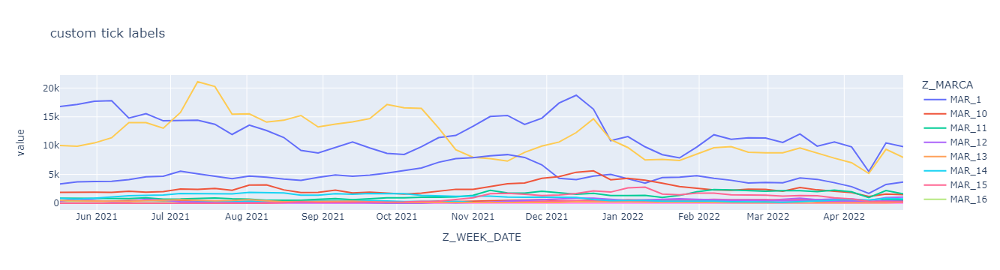

In [14]:
aux_ = pd.pivot_table(aux, index = 'Z_WEEK_DATE', values='Demanda', columns='Z_MARCA').reset_index()

import plotly.express as px

fig = px.line(aux_, x='Z_WEEK_DATE', y=aux_.columns,
              hover_data={'Z_WEEK_DATE': "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    #tickformat="%b\n%Y"
)
fig.show()

In [15]:
aux['Demanda'] = aux['Demanda'].map(lambda x: round(x,2))
df_pivot = pd.pivot_table(aux,
                          values='Demanda',
                          index='Z_MARCA',
                          columns='Z_WEEK_DATE')
df_pivot

Z_WEEK_DATE,2021-05-17,2021-05-24,2021-05-31,2021-06-07,2021-06-14,2021-06-21,2021-06-28,2021-07-05,2021-07-12,2021-07-19,...,2022-02-21,2022-02-28,2022-03-07,2022-03-14,2022-03-21,2022-03-28,2022-04-04,2022-04-11,2022-04-18,2022-04-25
Z_MARCA,,,,,,,,,,,,,,,,,,,,,
MAR_1,16792,17166,17707,17811,14791,15545,14313,14364,14419,13708,...,11373,11324,10545,12031,9904,10640,9787,5507,10467,9811
MAR_10,262,227,290,417,451,517,409,446,302,201,...,557,422,537,637,618,584,350,215,336,462
MAR_11,0,0,0,0,0,0,0,0,0,0,...,0,2,1,1,0,1,127,168,628,599
MAR_12,0,0,0,0,0,0,0,0,0,0,...,533,499,677,886,617,738,739,475,966,1083
MAR_13,102,148,146,98,135,99,97,113,111,116,...,1,0,0,0,0,0,0,0,0,0
MAR_14,173,133,150,152,133,163,147,206,208,258,...,2,3,0,4,0,0,0,0,0,0
MAR_15,0,0,0,0,0,0,0,0,0,0,...,629,656,557,612,244,168,169,94,84,84
MAR_16,287,260,160,164,92,143,162,241,133,43,...,0,0,0,0,0,0,0,0,0,0
MAR_17,63,52,47,42,41,37,22,49,49,27,...,0,0,0,0,0,0,0,0,0,0


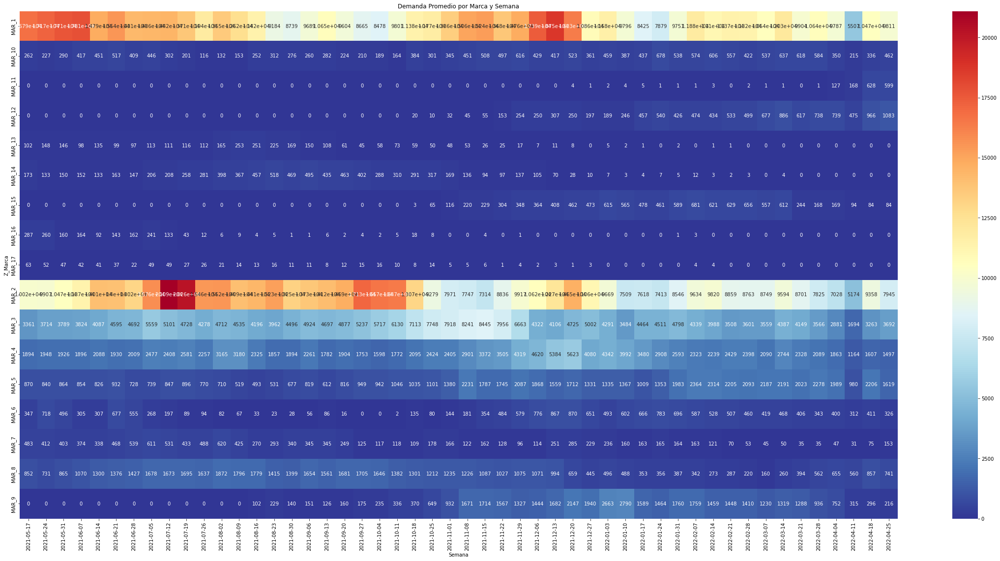

In [16]:
plt.figure(figsize = (40,19))
plt.title('Demanda Promedio por Marca y Semana')

sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt= '.4g',)
plt.xlabel('Semana')
plt.ylabel('Z_Marca')
plt.show()

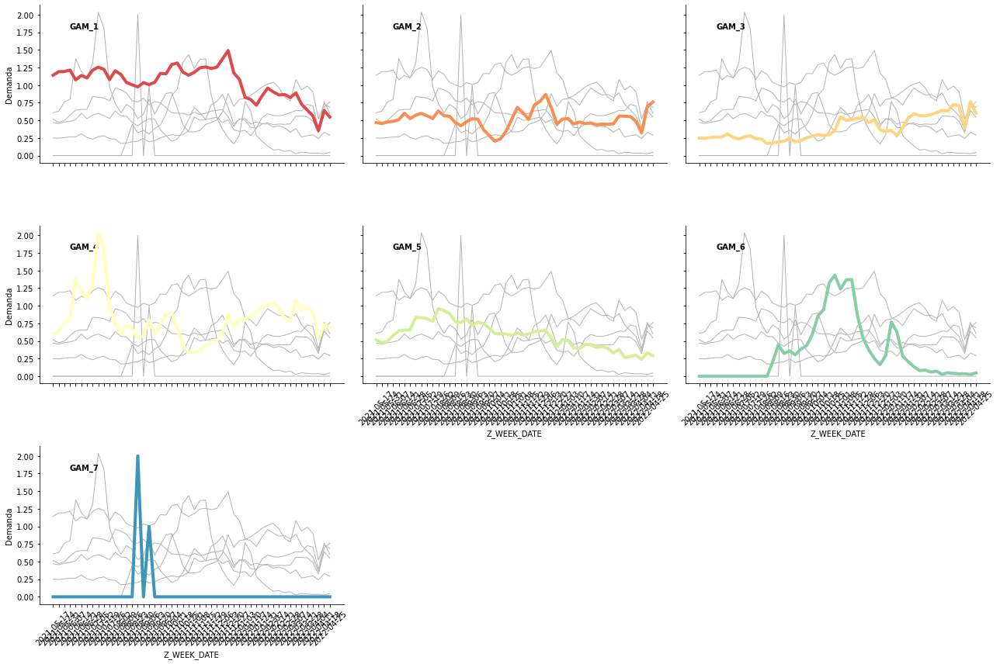

In [17]:
aux = train[['Z_GAMA', 'Demanda', 'Z_WEEK_DATE']].groupby(['Z_GAMA', 'Z_WEEK_DATE']).mean()
aux = aux[aux['Demanda'].notna()].reset_index()


g = sns.relplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda",
                col = "Z_GAMA", hue = "Z_GAMA",
                kind = "line", palette = "Spectral",   
                linewidth = 4, zorder = 5,
                col_wrap = 3, height = 4, aspect = 1.5, legend = False
               )

#add text and silhouettes
for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight="bold"
           )
    sns.lineplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda", units="Z_GAMA",
                 estimator = None, color= ".7", linewidth=1, ax=ax
                )

#ax.set_xticks('Z_WEEK_DATE', rotation = 90)
g.set_titles("")
g.set_axis_labels("Z_WEEK_DATE", "Demanda")
g.set_xticklabels(ax.get_xticklabels(),rotation = 45)
g.tight_layout()

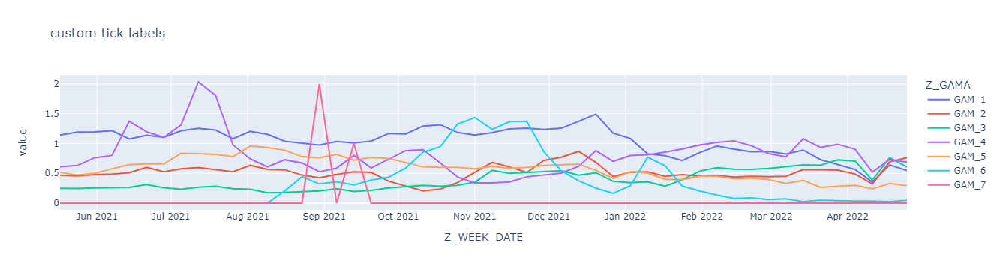

In [18]:
aux_ = pd.pivot_table(aux, index = 'Z_WEEK_DATE', values='Demanda', columns='Z_GAMA').reset_index()

import plotly.express as px

fig = px.line(aux_, x='Z_WEEK_DATE', y=aux_.columns,
              hover_data={'Z_WEEK_DATE': "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    #tickformat="%b\n%Y"
)
fig.show()

In [19]:
aux['Demanda'] = aux['Demanda'].map(lambda x: round(x,2))
df_pivot = pd.pivot_table(aux,
                          values='Demanda',
                          index='Z_GAMA',
                          columns='Z_WEEK_DATE')
df_pivot

Z_WEEK_DATE,2021-05-17,2021-05-24,2021-05-31,2021-06-07,2021-06-14,2021-06-21,2021-06-28,2021-07-05,2021-07-12,2021-07-19,...,2022-02-21,2022-02-28,2022-03-07,2022-03-14,2022-03-21,2022-03-28,2022-04-04,2022-04-11,2022-04-18,2022-04-25
Z_GAMA,,,,,,,,,,,,,,,,,,,,,
GAM_1,1.14,1.19,1.19,1.21,1.08,1.14,1.10,1.21,1.26,1.22,...,0.86,0.87,0.82,0.89,0.73,0.65,0.56,0.35,0.64,0.55
GAM_2,0.47,0.45,0.48,0.49,0.51,0.60,0.52,0.57,0.60,0.57,...,0.45,0.44,0.45,0.56,0.56,0.55,0.49,0.32,0.69,0.76
GAM_3,0.25,0.25,0.26,0.26,0.26,0.31,0.26,0.23,0.27,0.28,...,0.56,0.58,0.61,0.64,0.64,0.73,0.71,0.39,0.76,0.60
GAM_4,0.61,0.63,0.76,0.80,1.38,1.20,1.10,1.31,2.04,1.81,...,0.96,0.83,0.78,1.08,0.93,0.99,0.90,0.52,0.73,0.69
GAM_5,0.52,0.47,0.50,0.58,0.64,0.66,0.66,0.84,0.83,0.82,...,0.42,0.40,0.33,0.38,0.27,0.28,0.30,0.24,0.33,0.29
GAM_6,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.09,0.06,0.07,0.03,0.05,0.04,0.03,0.04,0.03,0.05
GAM_7,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00


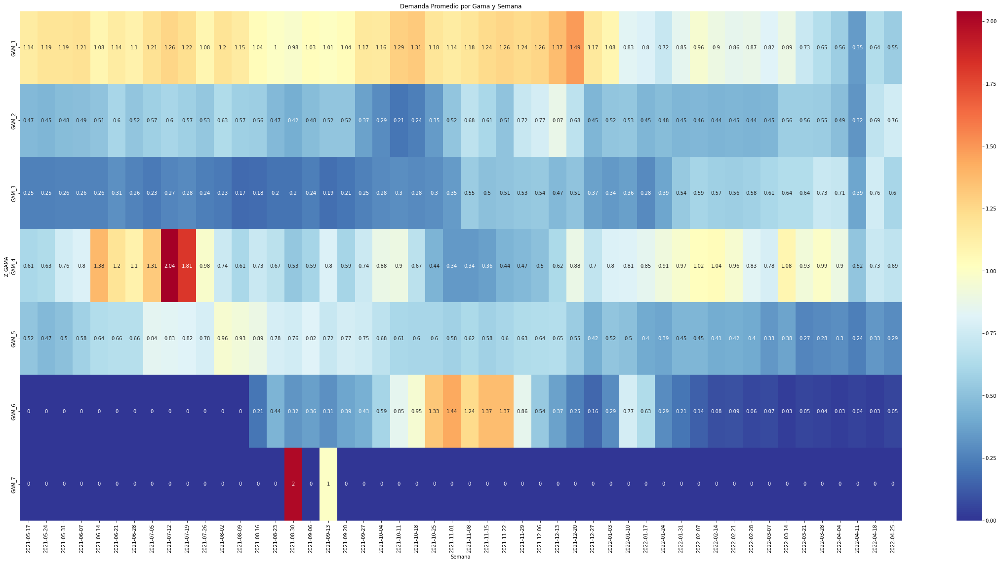

In [20]:
plt.figure(figsize = (40,19))
plt.title('Demanda Promedio por Gama y Semana')

sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt= '.4g',)
plt.xlabel('Semana')
plt.ylabel('Z_GAMA')
plt.show()

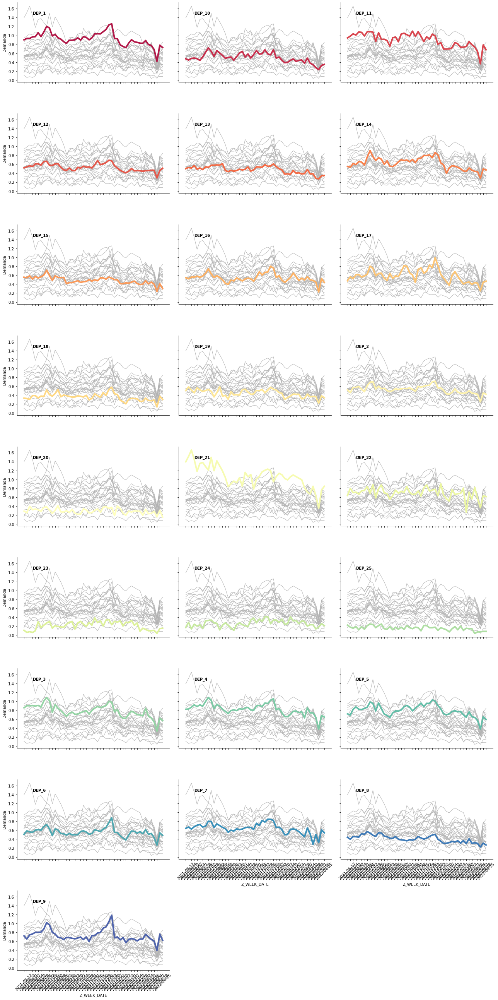

In [21]:
aux = train[['Z_DEPARTAMENTO', 'Demanda', 'Z_WEEK_DATE']].groupby(['Z_DEPARTAMENTO', 'Z_WEEK_DATE']).mean()
aux = aux[aux['Demanda'].notna()].reset_index()


g = sns.relplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda",
                col = "Z_DEPARTAMENTO", hue = "Z_DEPARTAMENTO",
                kind = "line", palette = "Spectral",   
                linewidth = 4, zorder = 5,
                col_wrap = 3, height = 4, aspect = 1.5, legend = False
               )

#add text and silhouettes
for time, ax in g.axes_dict.items():
    ax.text(.1, .85, time,
            transform = ax.transAxes, fontweight="bold"
           )
    sns.lineplot(data = aux, x = "Z_WEEK_DATE", y = "Demanda", units="Z_DEPARTAMENTO",
                 estimator = None, color= ".7", linewidth=1, ax=ax
                )

#ax.set_xticks('Z_WEEK_DATE', rotation = 90)
g.set_titles("")
g.set_axis_labels("Z_WEEK_DATE", "Demanda")
g.set_xticklabels(ax.get_xticklabels(),rotation = 45)
g.tight_layout()

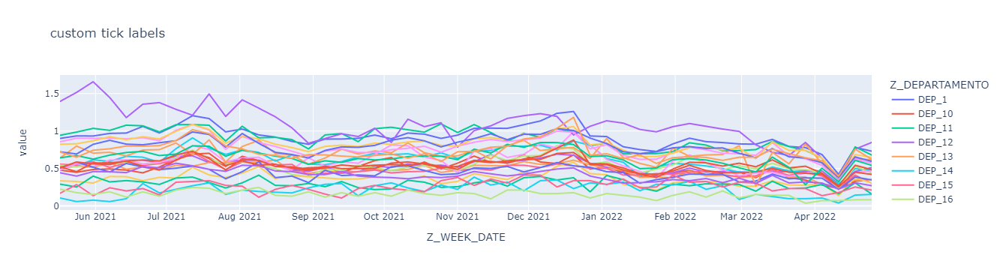

In [22]:
aux_ = pd.pivot_table(aux, index = 'Z_WEEK_DATE', values='Demanda', columns='Z_DEPARTAMENTO').reset_index()

import plotly.express as px

fig = px.line(aux_, x='Z_WEEK_DATE', y=aux_.columns,
              hover_data={'Z_WEEK_DATE': "|%B %d, %Y"},
              title='custom tick labels')
fig.update_xaxes(
    dtick="M1",
    #tickformat="%b\n%Y"
)
fig.show()

In [23]:
aux['Demanda'] = aux['Demanda'].map(lambda x: round(x,2))
df_pivot = pd.pivot_table(aux,
                          values='Demanda',
                          index='Z_DEPARTAMENTO',
                          columns='Z_WEEK_DATE')
df_pivot

Z_WEEK_DATE,2021-05-17,2021-05-24,2021-05-31,2021-06-07,2021-06-14,2021-06-21,2021-06-28,2021-07-05,2021-07-12,2021-07-19,...,2022-02-21,2022-02-28,2022-03-07,2022-03-14,2022-03-21,2022-03-28,2022-04-04,2022-04-11,2022-04-18,2022-04-25
Z_DEPARTAMENTO,,,,,,,,,,,,,,,,,,,,,
DEP_1,0.90,0.93,0.93,0.97,0.97,1.06,0.97,1.08,1.20,1.17,...,0.85,0.83,0.82,0.89,0.79,0.78,0.69,0.42,0.78,0.73
DEP_10,0.48,0.45,0.49,0.49,0.48,0.44,0.52,0.62,0.72,0.64,...,0.44,0.45,0.38,0.49,0.38,0.34,0.28,0.23,0.33,0.35
DEP_11,0.94,0.99,1.04,1.01,1.08,1.07,0.99,1.08,1.09,1.08,...,0.74,0.74,0.75,0.86,0.79,0.74,0.64,0.37,0.79,0.68
DEP_12,0.52,0.54,0.57,0.55,0.61,0.61,0.58,0.66,0.67,0.58,...,0.46,0.46,0.44,0.46,0.46,0.47,0.47,0.29,0.46,0.51
DEP_13,0.50,0.53,0.52,0.57,0.49,0.52,0.48,0.54,0.53,0.58,...,0.41,0.38,0.39,0.48,0.39,0.39,0.29,0.27,0.34,0.35
DEP_14,0.55,0.53,0.62,0.59,0.66,0.65,0.58,0.76,0.91,0.77,...,0.50,0.45,0.44,0.52,0.47,0.44,0.43,0.29,0.50,0.47
DEP_15,0.56,0.54,0.59,0.51,0.57,0.54,0.57,0.61,0.71,0.59,...,0.42,0.39,0.40,0.48,0.41,0.45,0.40,0.24,0.41,0.30
DEP_16,0.55,0.52,0.56,0.56,0.58,0.56,0.58,0.65,0.75,0.63,...,0.48,0.54,0.49,0.57,0.50,0.48,0.45,0.23,0.53,0.44
DEP_17,0.48,0.57,0.52,0.61,0.61,0.56,0.59,0.63,0.81,0.75,...,0.49,0.40,0.44,0.45,0.39,0.44,0.42,0.25,0.45,0.47


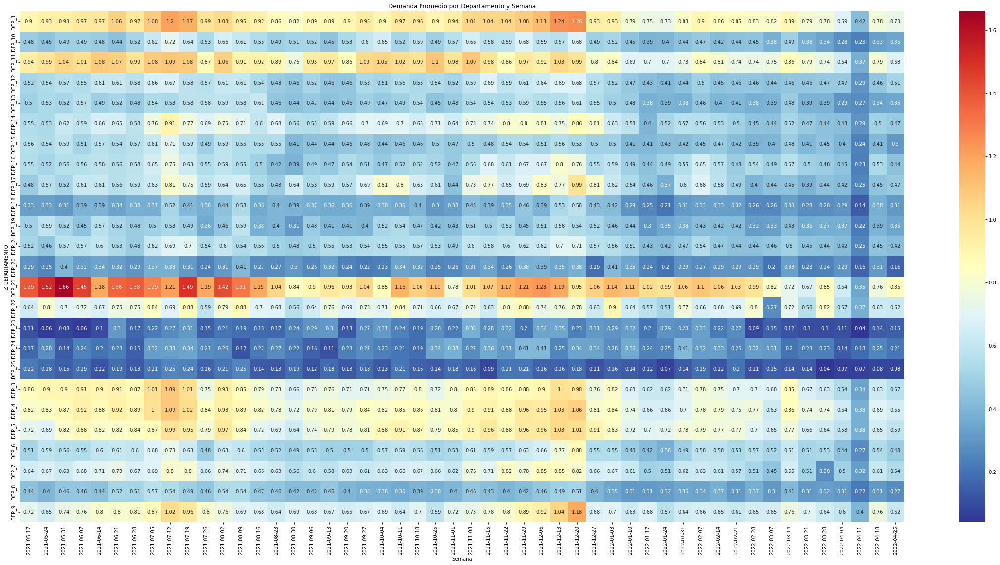

In [24]:
plt.figure(figsize = (40,19))
plt.title('Demanda Promedio por Departamento y Semana')

sns.heatmap(df_pivot, annot=True, cmap='RdYlBu_r', fmt= '.4g',)
plt.xlabel('Semana')
plt.ylabel('Z_DEPARTAMENTO')
plt.show()

In [25]:
aux_df = train[['Z_MODELO', 'Z_GAMA', 'Z_PUNTO_VENTA', 'Demanda']].groupby(['Z_MODELO', 'Z_GAMA', 'Z_PUNTO_VENTA']).min().reset_index()

In [26]:
aux_df = aux_df[aux_df['Demanda'].notna()]

In [27]:
aux_df

,Z_MODELO,Z_GAMA,Z_PUNTO_VENTA,Demanda
0,MOD_1,GAM_1,PVENT_1,0
1,MOD_1,GAM_1,PVENT_10,0
2,MOD_1,GAM_1,PVENT_100,0
3,MOD_1,GAM_1,PVENT_101,0
4,MOD_1,GAM_1,PVENT_102,0
...,...,...,...,...
47168,MOD_99,GAM_3,PVENT_95,0
47169,MOD_99,GAM_3,PVENT_96,0
47170,MOD_99,GAM_3,PVENT_97,0
47171,MOD_99,GAM_3,PVENT_98,0


In [28]:
aux_df[aux_df['Demanda'] != 0]

,Z_MODELO,Z_GAMA,Z_PUNTO_VENTA,Demanda
3531,MOD_11,GAM_1,PVENT_6,1
10512,MOD_15,GAM_5,PVENT_36,1
19246,MOD_3,GAM_4,PVENT_1,20
19247,MOD_3,GAM_4,PVENT_10,8
19252,MOD_3,GAM_4,PVENT_104,1
...,...,...,...,...
19703,MOD_3,GAM_4,PVENT_8,9
19704,MOD_3,GAM_4,PVENT_80,1
19713,MOD_3,GAM_4,PVENT_89,1
19714,MOD_3,GAM_4,PVENT_9,2


In [29]:
print(train[['Z_GAMA', 'Demanda', 'Z_YEAR', 'Z_MONTH' ]].groupby(['Z_YEAR','Z_GAMA', 'Z_MONTH']).agg(
                                                            func = {'Demanda': [np.mean, sum, min, max, pd.Series.nunique]}).to_string())

                        Demanda                          
                           mean     sum min   max nunique
Z_YEAR Z_GAMA Z_MONTH                                    
2021   GAM_1  5        1.175239   73282   0   808     133
              6        1.132451   94152   0  1032     139
              7        1.193060   99191   0   391     126
              8        1.074717  111690   0   411     122
              9        1.062329   88322   0   458     136
              10       1.237816  102912   0   762     155
              11       1.212663  126026   0   870     156
              12       1.322781  109976   0   934     160
       GAM_2  5        0.466814   17154   0   262      81
              6        0.530309   25983   0   357      97
              7        0.566209   27742   0   305     107
              8        0.530182   32471   0   353     100
              9        0.472345   23143   0   336      87
              10       0.268369   13149   0   134      57
              

In [30]:
train[train['Demanda'] != 0][['Z_MARCA', 'Demanda']].groupby(['Z_MARCA']).agg(func = {'Demanda': [np.mean, sum, min, max]})

Demanda                  
             mean     sum min   max
Z_MARCA                            
MAR_1    5.581683  611345   1  1032
MAR_10   3.529594   19321   1    40
MAR_11   4.917460    1549   1    25
MAR_12   3.712082   11552   1    40
MAR_13   1.418092    3151   1    21
MAR_14   2.524121    8110   1    87
MAR_15   2.702440   10299   1    31
MAR_16   1.996629    1777   1    34
MAR_17   1.399577     662   1     5
MAR_2    5.805417  575520   1  1451
MAR_3    4.060023  237625   1   600
MAR_4    2.904720  129719   1   271
MAR_5    3.253969   66612   1   231
MAR_6    2.368428   17974   1   380
MAR_7    2.202473   11933   1   110
MAR_8    3.644478   50917   1   240
MAR_9    3.893063   39791   1   442

In [31]:
train[[ 'Z_YEAR' , 'Z_MONTH', 'Demanda']].groupby([ 'Z_YEAR' , 'Z_MONTH']).agg(func = {'Demanda': [np.mean, sum, min, max]})

Demanda                  
                    mean     sum min   max
Z_YEAR Z_MONTH                            
2021   5        0.770709  109070   0   808
       6        0.824508  155578   0  1032
       7        0.912052  172097   0  1451
       8        0.765985  180669   0   552
       9        0.744817  140541   0   558
       10       0.774124  146071   0   762
       11       0.844246  199128   0   870
       12       0.929462  175382   0   934
2022   1        0.668535  157684   0   482
       2        0.704677  132967   0   671
       3        0.669938  126412   0   445
       4        0.541931  102258   0   497

### FEATURE ENGINEERING ###

In [32]:
#train[train['Z_MARCA'] == 'MAR_1'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()

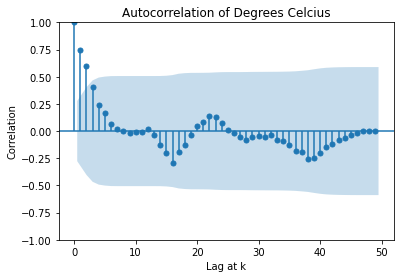

In [33]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

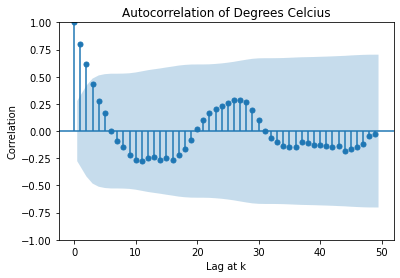

In [34]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_1'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

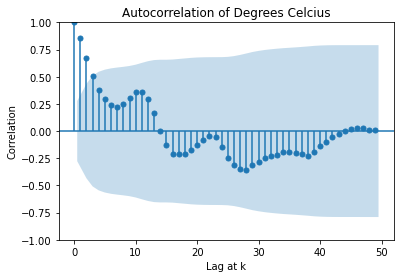

In [35]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_2'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

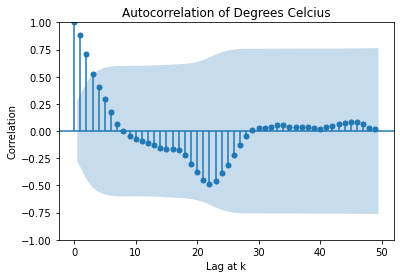

In [36]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_3'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

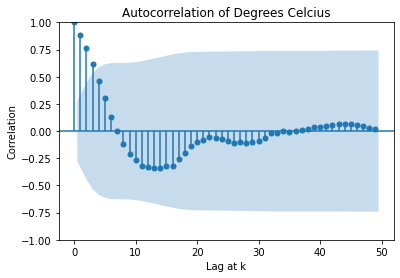

In [37]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_4'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

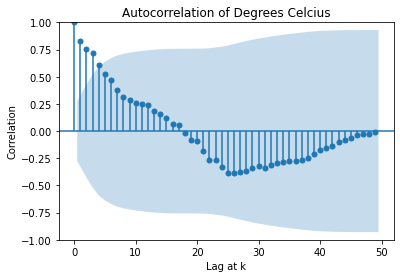

In [38]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_5'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

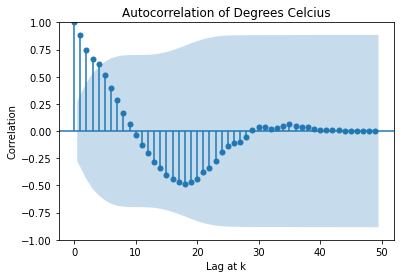

In [39]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_6'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

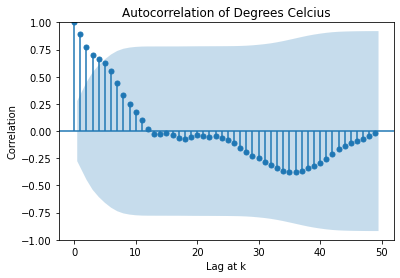

In [40]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_7'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

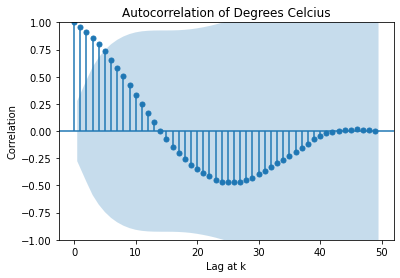

In [41]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_8'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

In [42]:
import numpy as np    

def cross_corr(y1, y2):
  """Calculates the cross correlation and lags without normalization.

  The definition of the discrete cross-correlation is in:
  https://www.mathworks.com/help/matlab/ref/xcorr.html

  Args:
    y1, y2: Should have the same length.

  Returns:
    max_corr: Maximum correlation without normalization.
    lag: The lag in terms of the index.
  """
  if len(y1) != len(y2):
    raise ValueError('The lengths of the inputs should be the same.')

  y1_auto_corr = np.dot(y1, y1) / len(y1)
  y2_auto_corr = np.dot(y2, y2) / len(y1)
  corr = np.correlate(y1, y2, mode='same')
  # The unbiased sample size is N - lag.
  unbiased_sample_size = np.correlate(
      np.ones(len(y1)), np.ones(len(y1)), mode='same')
  corr = corr / unbiased_sample_size / np.sqrt(y1_auto_corr * y2_auto_corr)
  shift = len(y1) // 2

  max_corr = np.max(corr)
  argmax_corr = np.argmax(corr)
  return max_corr, argmax_corr - shift

In [43]:
from statsmodels.tsa.stattools import acf

In [44]:
acf(train[train['Z_MARCA'] == 'MAR_9'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], nlags=49)

array([ 1.00000000e+00,  9.26143467e-01,  8.39831735e-01,  7.77961379e-01,
        7.14822532e-01,  6.48041374e-01,  5.96709236e-01,  5.37905454e-01,
        4.54570811e-01,  3.56602675e-01,  2.58020057e-01,  1.67958965e-01,
        8.52077117e-02, -6.60809334e-03, -1.00613521e-01, -1.69882264e-01,
       -2.11216427e-01, -2.39487384e-01, -2.78380934e-01, -3.11518959e-01,
       -3.55456223e-01, -4.01606540e-01, -4.35002698e-01, -4.43629418e-01,
       -4.36833575e-01, -4.18192741e-01, -3.90996500e-01, -3.64194664e-01,
       -3.45078828e-01, -3.31060393e-01, -3.15220424e-01, -2.95895260e-01,
       -2.64024339e-01, -2.37356824e-01, -1.89879235e-01, -1.38180268e-01,
       -1.14467708e-01, -9.59301301e-02, -7.18578427e-02, -4.78105219e-02,
       -3.12531782e-02, -1.49704671e-02,  3.63513561e-04,  1.12035079e-02,
        2.42655288e-02,  3.65535855e-02,  4.00534021e-02,  3.89593661e-02,
        2.69549300e-02,  1.44761286e-02])

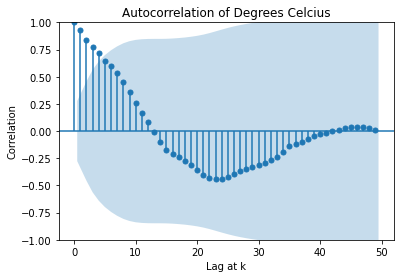

In [45]:
from statsmodels.graphics.tsaplots import plot_acf

#rcParams["figure.figsize"] = 14, 4
fig = plot_acf(train[train['Z_MARCA'] == 'MAR_9'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], lags=49)

plt.title("Autocorrelation of Degrees Celcius")
plt.ylabel("Correlation")
plt.xlabel("Lag at k")
fig.show();

In [46]:
corr, lag = cross_corr(train[train['Z_MARCA'] == 'MAR_9'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"], train[train['Z_MARCA'] == 'MAR_9'][['Demanda', 'Z_WEEK_DATE']].groupby('Z_WEEK_DATE').sum()["Demanda"])

In [47]:
train['ID'] = train['Z_MODELO'] + '-' + train['Z_GAMA'] + '-' + train['Z_PUNTO_VENTA']

### Lagging ###

In [48]:
train['Demanda_prev_1'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(1)
train['Demanda_prev_2'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(2)
train['Demanda_prev_3'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(3)
train['Demanda_prev_4'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(4)
train['Demanda_prev_5'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(5)
train['Demanda_prev_6'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(6)
train['Demanda_prev_7'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(7)
train['Demanda_prev_8'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(8)
train['Demanda_prev_9'] = train[['ID', 'Demanda']].groupby('ID')['Demanda'].shift(9)

In [49]:
train.columns

Index(['Z_MARCA', 'Z_GAMA', 'Z_MODELO', 'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA',
       'Z_WEEK', 'Demanda', 'Z_WEEK_DATE', 'Z_DAY', 'Z_MONTH', 'Z_YEAR', 'ID',
       'Demanda_prev_1', 'Demanda_prev_2', 'Demanda_prev_3', 'Demanda_prev_4',
       'Demanda_prev_5', 'Demanda_prev_6', 'Demanda_prev_7', 'Demanda_prev_8',
       'Demanda_prev_9'],
      dtype='object')

### Rolling Previous Stats ###

In [50]:
firstAttempt = True
for window in tqdm([3,5,9]):
    roll_prev_mean = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).mean()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_mean_rolling_' + str(window)})
    roll_prev_median = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).mean()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_median_rolling_' + str(window)})
    roll_prev_max = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).max()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_max_rolling_' + str(window)})
    roll_prev_min = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).min()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_min_rolling_' + str(window)})
    roll_prev_std = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).std()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_std_rolling_' + str(window)})
    roll_prev_skew = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).skew()
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_skew_rolling_' + str(window)})
    roll_prev_kurt = pd.DataFrame(train[['ID', 'Demanda_prev_1']].groupby('ID')['Demanda_prev_1'].rolling(window,
                                                                           min_periods= 1).apply(pd.DataFrame.kurt)
                                                                        ).reset_index().rename(columns = {'Demanda_prev_1': \
                                                                                                'Demanda_kurt_rolling_'+ str(window)})

    roll_prev_mean.index = roll_prev_mean.level_1.values
    roll_prev_median.index = roll_prev_median.level_1.values
    roll_prev_max.index = roll_prev_max.level_1.values
    roll_prev_min.index = roll_prev_min.level_1.values
    roll_prev_std.index = roll_prev_std.level_1.values
    roll_prev_skew.index = roll_prev_skew.level_1.values
    roll_prev_kurt.index = roll_prev_kurt.level_1.values
    
    if not firstAttempt:
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_mean.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_median.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_max.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_min.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_std.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_skew.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_kurt.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
    else:
        roll_cum_stats = pd.merge(roll_prev_mean.drop(['ID', 'level_1'], axis = 1), roll_prev_median.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_max.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_min.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_std.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_skew.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        roll_cum_stats = pd.merge(roll_cum_stats, roll_prev_kurt.drop(['ID', 'level_1'], axis = 1), left_index=True, right_index=True)
        firstAttempt = False

100%|███████████████████████████████████████████████████████████████████████████████████| 3/3 [09:26<00:00, 188.96s/it]


In [51]:
roll_cum_stats

,Demanda_mean_rolling_3,Demanda_median_rolling_3,Demanda_max_rolling_3,Demanda_min_rolling_3,Demanda_std_rolling_3,Demanda_skew_rolling_3,Demanda_kurt_rolling_3,Demanda_mean_rolling_5,Demanda_median_rolling_5,Demanda_max_rolling_5,...,Demanda_std_rolling_5,Demanda_skew_rolling_5,Demanda_kurt_rolling_5,Demanda_mean_rolling_9,Demanda_median_rolling_9,Demanda_max_rolling_9,Demanda_min_rolling_9,Demanda_std_rolling_9,Demanda_skew_rolling_9,Demanda_kurt_rolling_9
37873,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
85046,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN,0.0,0.0,0.0,...,NaN,NaN,NaN,0.000000,0.000000,0.0,0.0,NaN,NaN,NaN
132219,0.000000,0.000000,0.0,0.0,0.000000e+00,NaN,NaN,0.0,0.0,0.0,...,0.000000,NaN,NaN,0.000000,0.000000,0.0,0.0,0.000000,NaN,NaN
179392,0.000000,0.000000,0.0,0.0,0.000000e+00,NaN,NaN,0.0,0.0,0.0,...,0.000000,NaN,NaN,0.000000,0.000000,0.0,0.0,0.000000,NaN,NaN
226565,0.000000,0.000000,0.0,0.0,0.000000e+00,NaN,NaN,0.0,0.0,0.0,...,0.000000,NaN,0.000000,0.000000,0.000000,0.0,0.0,0.000000,NaN,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2130719,0.333333,0.333333,1.0,0.0,5.773503e-01,1.732051,NaN,0.6,0.6,1.0,...,0.547723,-0.608581,-3.333333,0.333333,0.333333,1.0,0.0,0.500000,0.857143,-1.714286
2177892,0.333333,0.333333,1.0,0.0,5.773503e-01,1.732051,NaN,0.4,0.4,1.0,...,0.547723,0.608581,-3.333333,0.333333,0.333333,1.0,0.0,0.500000,0.857143,-1.714286
2225065,0.000000,0.000000,0.0,0.0,1.290478e-08,NaN,NaN,0.2,0.2,1.0,...,0.447214,2.236068,5.000000,0.333333,0.333333,1.0,0.0,0.500000,0.857143,-1.714286
2272238,0.333333,0.333333,1.0,0.0,5.773503e-01,1.732051,NaN,0.4,0.4,1.0,...,0.547723,0.608581,-3.333333,0.444444,0.444444,1.0,0.0,0.527046,0.271052,-2.571429


In [55]:
train_models = pd.merge(train, roll_cum_stats, left_index=True, right_index=True)

In [56]:
train_models.corr()

,Demanda,Z_DAY,Z_MONTH,Z_YEAR,Demanda_prev_1,Demanda_prev_2,Demanda_prev_3,Demanda_prev_4,Demanda_prev_5,Demanda_prev_6,...,Demanda_std_rolling_5,Demanda_skew_rolling_5,Demanda_kurt_rolling_5,Demanda_mean_rolling_9,Demanda_median_rolling_9,Demanda_max_rolling_9,Demanda_min_rolling_9,Demanda_std_rolling_9,Demanda_skew_rolling_9,Demanda_kurt_rolling_9
Demanda,1.000000,-0.002035,0.012116,-0.013753,0.881644,0.795727,0.738297,0.703393,0.658694,0.609231,...,0.663891,-0.130635,-0.016035,0.775331,0.775331,0.743002,0.672477,0.675559,-0.155650,-0.024446
Z_DAY,-0.002035,1.000000,-0.084535,0.000584,0.000519,-0.001466,-0.003237,-0.002992,-0.000863,0.003736,...,-0.002474,0.009470,-0.000634,-0.000713,-0.000713,-0.003806,0.004463,-0.001640,0.006735,-0.004809
Z_MONTH,0.012116,-0.084535,1.000000,-0.839799,0.011483,0.008517,0.005171,0.003077,0.001283,-0.000105,...,0.006603,-0.001199,0.007277,0.003135,0.003135,0.004538,-0.000524,0.002529,0.013868,0.016224
Z_YEAR,-0.013753,0.000584,-0.839799,1.000000,-0.013006,-0.010745,-0.007239,-0.005299,-0.003831,-0.002794,...,-0.002550,0.018776,-0.003815,-0.005401,-0.005401,0.003708,-0.017895,0.005224,0.039541,0.007785
Demanda_prev_1,0.881644,0.000519,0.011483,-0.013006,1.000000,0.882199,0.796707,0.737894,0.702615,0.658157,...,0.719039,-0.139254,-0.017064,0.837216,0.837216,0.799778,0.735430,0.717587,-0.162730,-0.024708
Demanda_prev_2,0.795727,-0.001466,0.008517,-0.010745,0.882199,1.000000,0.884335,0.796770,0.737032,0.701569,...,0.742753,-0.159566,-0.025549,0.874611,0.874611,0.822468,0.763537,0.731556,-0.179755,-0.034096
Demanda_prev_3,0.738297,-0.003237,0.005171,-0.007239,0.796707,0.884335,1.000000,0.885480,0.798408,0.739430,...,0.775116,-0.166689,-0.029270,0.900156,0.900156,0.838962,0.776527,0.747731,-0.191565,-0.038659
Demanda_prev_4,0.703393,-0.002992,0.003077,-0.005299,0.737894,0.796770,0.885480,1.000000,0.885570,0.798181,...,0.804678,-0.160585,-0.028568,0.913279,0.913279,0.849700,0.775599,0.764924,-0.200128,-0.041244
Demanda_prev_5,0.658694,-0.000863,0.001283,-0.003831,0.702615,0.737032,0.798408,0.885570,1.000000,0.885383,...,0.806215,-0.138095,-0.014903,0.917682,0.917682,0.855814,0.767913,0.780012,-0.203489,-0.042786
Demanda_prev_6,0.609231,0.003736,-0.000105,-0.002794,0.658157,0.701569,0.739430,0.798181,0.885383,1.000000,...,0.739034,-0.128231,-0.013375,0.912096,0.912096,0.857972,0.761394,0.790751,-0.202142,-0.043008


In [66]:
descriptive_columns = ['Z_MARCA', 'Z_GAMA', 'Z_MODELO', 'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA']

In [60]:
train_models.columns

Index(['Z_MARCA', 'Z_GAMA', 'Z_MODELO', 'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA',
       'Z_WEEK', 'Demanda', 'Z_WEEK_DATE', 'Z_DAY', 'Z_MONTH', 'Z_YEAR', 'ID',
       'Demanda_prev_1', 'Demanda_prev_2', 'Demanda_prev_3', 'Demanda_prev_4',
       'Demanda_prev_5', 'Demanda_prev_6', 'Demanda_prev_7', 'Demanda_prev_8',
       'Demanda_prev_9', 'Demanda_mean_rolling_3', 'Demanda_median_rolling_3',
       'Demanda_max_rolling_3', 'Demanda_min_rolling_3',
       'Demanda_std_rolling_3', 'Demanda_skew_rolling_3',
       'Demanda_kurt_rolling_3', 'Demanda_mean_rolling_5',
       'Demanda_median_rolling_5', 'Demanda_max_rolling_5',
       'Demanda_min_rolling_5', 'Demanda_std_rolling_5',
       'Demanda_skew_rolling_5', 'Demanda_kurt_rolling_5',
       'Demanda_mean_rolling_9', 'Demanda_median_rolling_9',
       'Demanda_max_rolling_9', 'Demanda_min_rolling_9',
       'Demanda_std_rolling_9', 'Demanda_skew_rolling_9',
       'Demanda_kurt_rolling_9'],
      dtype='object')

In [58]:
from sklearn.model_selection import KFold

In [70]:
for feature in descriptive_columns:
    train_models[feature] = pd.Series(train_models[feature], dtype="category")
    train_models[feature] = pd.Series(train_models[feature], dtype="category")

In [71]:
X_train = train_models[['Z_MARCA', 'Z_GAMA', 'Z_MODELO', 
           'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA',
           'Z_DAY', 'Z_MONTH', 'Z_YEAR','Demanda_prev_1', 'Demanda_prev_2', 'Demanda_prev_3', 'Demanda_prev_4',
       'Demanda_prev_5', 'Demanda_prev_6', 'Demanda_prev_7', 'Demanda_prev_8',
       'Demanda_prev_9', 'Demanda_mean_rolling_3', 'Demanda_median_rolling_3',
       'Demanda_max_rolling_3', 'Demanda_min_rolling_3',
       'Demanda_std_rolling_3',  'Demanda_mean_rolling_5',
       'Demanda_median_rolling_5', 'Demanda_max_rolling_5',
       'Demanda_min_rolling_5', 'Demanda_std_rolling_5',
       'Demanda_skew_rolling_5', 'Demanda_kurt_rolling_5',
       'Demanda_mean_rolling_9', 'Demanda_median_rolling_9',
       'Demanda_max_rolling_9', 'Demanda_min_rolling_9',
       'Demanda_std_rolling_9', 'Demanda_skew_rolling_9',
       'Demanda_kurt_rolling_9'
          ]]
y = train_models['Demanda']

#X_test = test[['Z_MARCA', 'Z_GAMA', 'Z_MODELO', 
#           'Z_DEPARTAMENTO', 'Z_PUNTO_VENTA',
#           'Z_DAY', 'Z_MONTH', 'Z_YEAR', 'Demanda_prev_1', 'Demanda_prev_2', 'Demanda_prev_3', 'Demanda_prev_4',
#                 'Demanda_prev_5'
#          ]]
#y = test['Demanda']

X_training, X_val, y_training, y_val = train_test_split(X_train, y,
                                                    test_size = 0.2,
                                                    random_state=90)

In [72]:
random_seed = 2019
np.random.seed(random_seed)

In [73]:
categorical_features_indices = np.where(X_train.dtypes == 'category') [0]
categorical_features_indices

array([0, 1, 2, 3, 4], dtype=int64)

In [74]:
train_pool = cb.Pool(X_training, y_training,cat_features=categorical_features_indices)
validation_pool = cb.Pool(X_val, y_val,cat_features=categorical_features_indices)

In [75]:
model = cb.CatBoostRegressor(iterations=5000,  random_seed=42, early_stopping_rounds=50)

model.fit(train_pool, eval_set=validation_pool, verbose=100, plot=True)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.062347
0:	learn: 5.7485765	test: 5.6089247	best: 5.6089247 (0)	total: 958ms	remaining: 1h 19m 50s
100:	learn: 2.4284710	test: 2.7826183	best: 2.7826183 (100)	total: 59.1s	remaining: 47m 49s
200:	learn: 2.1667822	test: 2.7044649	best: 2.7044649 (200)	total: 2m 1s	remaining: 48m 9s
300:	learn: 2.0159887	test: 2.6694642	best: 2.6681622 (296)	total: 3m 2s	remaining: 47m 26s
400:	learn: 1.9294594	test: 2.6405476	best: 2.6399618 (399)	total: 4m	remaining: 45m 59s
500:	learn: 1.8502135	test: 2.6116406	best: 2.6116406 (500)	total: 5m 1s	remaining: 45m 9s
600:	learn: 1.7858727	test: 2.5881137	best: 2.5873617 (597)	total: 6m 4s	remaining: 44m 27s
700:	learn: 1.7294696	test: 2.5640446	best: 2.5640446 (700)	total: 7m 8s	remaining: 43m 50s
800:	learn: 1.6870097	test: 2.5460756	best: 2.5454253 (792)	total: 8m 12s	remaining: 43m 3s
900:	learn: 1.6436247	test: 2.5321545	best: 2.5315687 (884)	total: 9m 17s	remaining: 42m 15s
1000:	learn: 1.6117834	test: 2.5228826	best: 2.5228336 

In [76]:
y_pred = model.predict(X_val)

In [77]:
from sklearn.metrics import mean_squared_error
import math
mse = mean_squared_error(y_val, y_pred)
rmse = math.sqrt(mse)
print('RMSE: %f' % rmse)

RMSE: 2.444118


Text(0.5, 1.0, 'Feature Importance')

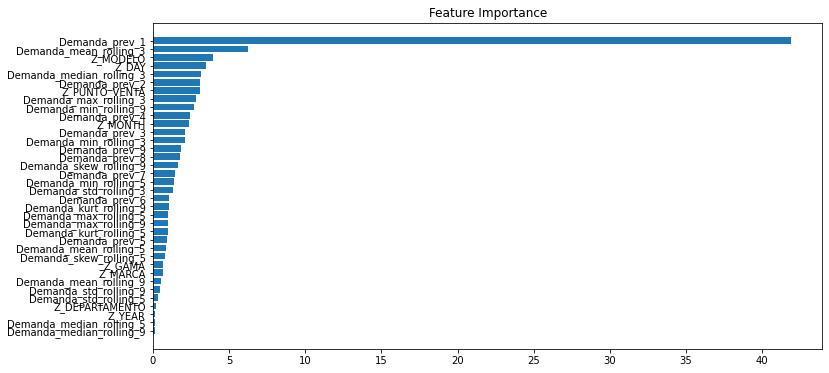

In [80]:

feature_importance = model.feature_importances_
sorted_idx = np.argsort(feature_importance)
fig = plt.figure(figsize=(12, 6))
plt.barh(range(len(sorted_idx)), feature_importance[sorted_idx], align='center')
plt.yticks(range(len(sorted_idx)), np.array(X_val.columns)[sorted_idx])
plt.title('Feature Importance')


In [ ]:
submit = test.copy()
submit['Demanda'] = model.predict(X_test)
submit.loc[submit['Demanda'] < 0, 'Demanda'] = 0 
reverse_mapping_file = '..\\utils\\reverse_dict_mapping_list.txt'

with open(reverse_mapping_file, 'rb') as f:
    reverse_mapping = pickle.load( f)

i=0
for column in descriptive_columns:
    submit[column] = submit[column].map(reverse_mapping[i])
    i+=1
    
submit['ID'] = submit['Z_MODELO'] + '|' + submit['Z_PUNTO_VENTA'] + '|' + submit['Z_GAMA'] + '|' + submit['Z_WEEK']
submission = submit[['ID','Demanda']].groupby('ID').sum().reset_index()
submission[['ID', 'Demanda']].to_csv('Submission_01.csv', index = False, sep = ',')

### Prophet ###

In [7]:
train['ID'] = train['Z_MODELO'] + '|' + train['Z_PUNTO_VENTA'] + '|' + train['Z_GAMA']
test['ID'] = test['Z_MODELO'] + '|' + test['Z_PUNTO_VENTA'] + '|' + test['Z_GAMA']

In [8]:
test

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_318|PVENT_26|GAM_3
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_305|PVENT_212|GAM_1
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_246|PVENT_169|GAM_3
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_286|PVENT_161|GAM_4
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_282|PVENT_69|GAM_4
...,...,...,...,...,...,...,...,...,...,...,...,...
471725,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_175|GAM_1
471726,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_217|GAM_1
471727,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_353|GAM_1
471728,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_391|GAM_1


In [9]:
m = Prophet(interval_width=0.95,weekly_seasonality=False , daily_seasonality=True, yearly_seasonality=True)
m.fit(train[['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'}))
future = m.make_future_dataframe(periods=10, freq = 'W')
fcst = m.predict(future)

In [10]:
m

In [11]:
fcst

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,daily_lower,daily_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2021-05-17,2326.882717,32187.728947,39276.167230,2326.882717,2326.882717,33420.499259,33420.499259,33420.499259,36752.96484,36752.96484,36752.96484,-3332.465580,-3332.465580,-3332.465580,0.0,0.0,0.0,35747.381976
1,2021-05-24,2197.341098,32166.957519,39502.329335,2197.341098,2197.341098,33651.161824,33651.161824,33651.161824,36752.96484,36752.96484,36752.96484,-3101.803016,-3101.803016,-3101.803016,0.0,0.0,0.0,35848.502922
2,2021-05-31,2067.799479,33729.031362,40870.165823,2067.799479,2067.799479,35334.843292,35334.843292,35334.843292,36752.96484,36752.96484,36752.96484,-1418.121547,-1418.121547,-1418.121547,0.0,0.0,0.0,37402.642771
3,2021-06-07,1938.257860,34950.592921,42227.397908,1938.257860,1938.257860,36707.820034,36707.820034,36707.820034,36752.96484,36752.96484,36752.96484,-45.144806,-45.144806,-45.144806,0.0,0.0,0.0,38646.077894
4,2021-06-14,1808.716241,35208.263511,42330.772468,1808.716241,1808.716241,36945.243924,36945.243924,36945.243924,36752.96484,36752.96484,36752.96484,192.279084,192.279084,192.279084,0.0,0.0,0.0,38753.960164
5,2021-06-21,1679.174621,35107.385781,42475.493629,1679.174621,1679.174621,37139.716813,37139.716813,37139.716813,36752.96484,36752.96484,36752.96484,386.751973,386.751973,386.751973,0.0,0.0,0.0,38818.891434
6,2021-06-28,1549.633002,36490.733954,43738.587095,1549.633002,1549.633002,38741.985601,38741.985601,38741.985601,36752.96484,36752.96484,36752.96484,1989.020761,1989.020761,1989.020761,0.0,0.0,0.0,40291.618603
7,2021-07-05,1420.091383,39299.101567,46593.276300,1420.091383,1420.091383,41508.515786,41508.515786,41508.515786,36752.96484,36752.96484,36752.96484,4755.550947,4755.550947,4755.550947,0.0,0.0,0.0,42928.607169
8,2021-07-12,1290.549764,41256.228162,48260.616873,1290.549764,1290.549764,43496.360787,43496.360787,43496.360787,36752.96484,36752.96484,36752.96484,6743.395947,6743.395947,6743.395947,0.0,0.0,0.0,44786.910551
9,2021-07-19,1161.008145,40500.714304,48070.805512,1161.008145,1161.008145,43091.557467,43091.557467,43091.557467,36752.96484,36752.96484,36752.96484,6338.592627,6338.592627,6338.592627,0.0,0.0,0.0,44252.565612


In [12]:
train[['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'})

,ds,y
0,2021-05-17,35503
1,2021-05-24,36256
2,2021-05-31,37311
3,2021-06-07,38374
4,2021-06-14,38599
5,2021-06-21,40481
6,2021-06-28,38124
7,2021-07-05,42511
8,2021-07-12,47069
9,2021-07-19,45037


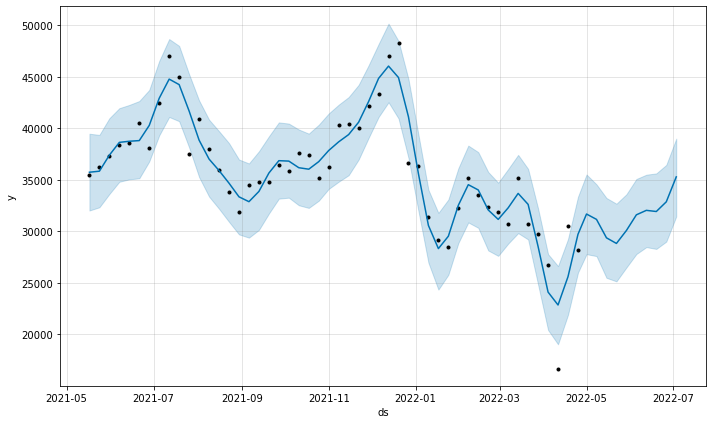

In [13]:
fcst = m.predict(future)
fig = m.plot(fcst)

In [14]:
len(test['ID'].unique())

47173

In [15]:
base = train[['ID', 'Demanda', 'Z_WEEK_DATE']].groupby(['ID', 'Z_WEEK_DATE']).sum().sort_values('Demanda' , ascending = [False]).reset_index()
base_cum = train[['Demanda', 'Z_WEEK_DATE']].groupby([ 'Z_WEEK_DATE']).sum().sort_values('Demanda' , ascending = [False]).reset_index()

In [16]:
pred = fcst[['ds', 'yhat']]
pred.columns = ['Z_WEEK_DATE', 'yhat']

In [17]:
pred

,Z_WEEK_DATE,yhat
0,2021-05-17,35747.381976
1,2021-05-24,35848.502922
2,2021-05-31,37402.642771
3,2021-06-07,38646.077894
4,2021-06-14,38753.960164
5,2021-06-21,38818.891434
6,2021-06-28,40291.618603
7,2021-07-05,42928.607169
8,2021-07-12,44786.910551
9,2021-07-19,44252.565612


In [18]:
base = base.merge(base_cum[['Z_WEEK_DATE', 'Demanda']].rename(columns = {'Demanda': 'Demanda_Total'}), on = 'Z_WEEK_DATE', how = "left")
base['ratio'] = base['Demanda']*100/base['Demanda_Total']

In [19]:
aux = base[base['Z_WEEK_DATE'] >= '2022-04-11'][['ID', 'ratio']].groupby('ID').mean().reset_index()
aux.sort_values('ratio', ascending = [False])

,ID,ratio
13723,MOD_1|PVENT_1|GAM_1,1.031327
13834,MOD_1|PVENT_2|GAM_1,0.764974
14038,MOD_1|PVENT_4|GAM_1,0.467591
14060,MOD_1|PVENT_6|GAM_1,0.417956
14049,MOD_1|PVENT_5|GAM_1,0.401341
...,...,...
19293,MOD_30|PVENT_135|GAM_1,0.000000
19294,MOD_30|PVENT_136|GAM_1,0.000000
19295,MOD_30|PVENT_137|GAM_1,0.000000
19296,MOD_30|PVENT_138|GAM_1,0.000000


In [20]:
aux

,ID,ratio
0,MOD_100|PVENT_100|GAM_1,0.0
1,MOD_100|PVENT_103|GAM_1,0.0
2,MOD_100|PVENT_104|GAM_1,0.0
3,MOD_100|PVENT_105|GAM_1,0.0
4,MOD_100|PVENT_106|GAM_1,0.0
...,...,...
47168,MOD_9|PVENT_96|GAM_1,0.0
47169,MOD_9|PVENT_97|GAM_1,0.0
47170,MOD_9|PVENT_98|GAM_1,0.0
47171,MOD_9|PVENT_99|GAM_1,0.0


In [21]:
test['ID'] = test['Z_MODELO'] + '|' + test['Z_PUNTO_VENTA'] + '|' + test['Z_GAMA']

In [22]:
test

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_318|PVENT_26|GAM_3
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_305|PVENT_212|GAM_1
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_246|PVENT_169|GAM_3
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_286|PVENT_161|GAM_4
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_282|PVENT_69|GAM_4
...,...,...,...,...,...,...,...,...,...,...,...,...
471725,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_175|GAM_1
471726,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_217|GAM_1
471727,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_353|GAM_1
471728,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_391|GAM_1


In [23]:
test[test['ID'].isin(aux['ID'].unique())]

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_318|PVENT_26|GAM_3
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_305|PVENT_212|GAM_1
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_246|PVENT_169|GAM_3
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_286|PVENT_161|GAM_4
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_282|PVENT_69|GAM_4
...,...,...,...,...,...,...,...,...,...,...,...,...
471725,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_175|GAM_1
471726,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_217|GAM_1
471727,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_353|GAM_1
471728,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_391|GAM_1


In [24]:
aux

,ID,ratio
0,MOD_100|PVENT_100|GAM_1,0.0
1,MOD_100|PVENT_103|GAM_1,0.0
2,MOD_100|PVENT_104|GAM_1,0.0
3,MOD_100|PVENT_105|GAM_1,0.0
4,MOD_100|PVENT_106|GAM_1,0.0
...,...,...
47168,MOD_9|PVENT_96|GAM_1,0.0
47169,MOD_9|PVENT_97|GAM_1,0.0
47170,MOD_9|PVENT_98|GAM_1,0.0
47171,MOD_9|PVENT_99|GAM_1,0.0


In [25]:
test = test.merge(aux, on='ID', how = "left")

In [26]:
pred_train = pred[pred['Z_WEEK_DATE'] < '2022-05-01']

In [27]:
pred_train['Z_WEEK_DATE'].unique()

array(['2021-05-17T00:00:00.000000000', '2021-05-24T00:00:00.000000000',
       '2021-05-31T00:00:00.000000000', '2021-06-07T00:00:00.000000000',
       '2021-06-14T00:00:00.000000000', '2021-06-21T00:00:00.000000000',
       '2021-06-28T00:00:00.000000000', '2021-07-05T00:00:00.000000000',
       '2021-07-12T00:00:00.000000000', '2021-07-19T00:00:00.000000000',
       '2021-07-26T00:00:00.000000000', '2021-08-02T00:00:00.000000000',
       '2021-08-09T00:00:00.000000000', '2021-08-16T00:00:00.000000000',
       '2021-08-23T00:00:00.000000000', '2021-08-30T00:00:00.000000000',
       '2021-09-06T00:00:00.000000000', '2021-09-13T00:00:00.000000000',
       '2021-09-20T00:00:00.000000000', '2021-09-27T00:00:00.000000000',
       '2021-10-04T00:00:00.000000000', '2021-10-11T00:00:00.000000000',
       '2021-10-18T00:00:00.000000000', '2021-10-25T00:00:00.000000000',
       '2021-11-01T00:00:00.000000000', '2021-11-08T00:00:00.000000000',
       '2021-11-15T00:00:00.000000000', '2021-11-22

In [28]:
pred_train['Z_WEEK_DATE'] = pred_train['Z_WEEK_DATE'].astype(str)
pred_train['Z_WEEK_DATE']

0     2021-05-17
1     2021-05-24
2     2021-05-31
3     2021-06-07
4     2021-06-14
5     2021-06-21
6     2021-06-28
7     2021-07-05
8     2021-07-12
9     2021-07-19
10    2021-07-26
11    2021-08-02
12    2021-08-09
13    2021-08-16
14    2021-08-23
15    2021-08-30
16    2021-09-06
17    2021-09-13
18    2021-09-20
19    2021-09-27
20    2021-10-04
21    2021-10-11
22    2021-10-18
23    2021-10-25
24    2021-11-01
25    2021-11-08
26    2021-11-15
27    2021-11-22
28    2021-11-29
29    2021-12-06
30    2021-12-13
31    2021-12-20
32    2021-12-27
33    2022-01-03
34    2022-01-10
35    2022-01-17
36    2022-01-24
37    2022-01-31
38    2022-02-07
39    2022-02-14
40    2022-02-21
41    2022-02-28
42    2022-03-07
43    2022-03-14
44    2022-03-21
45    2022-03-28
46    2022-04-04
47    2022-04-11
48    2022-04-18
49    2022-04-25
Name: Z_WEEK_DATE, dtype: object

In [29]:
train = train.merge(pred_train, on = 'Z_WEEK_DATE', how = "left")

In [30]:
train['yhat_fixed'] = train['yhat']
train ### TIENES LOS VALORES DEL YHAT EN EL DATASET DEL TRAINING

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID,yhat,yhat_fixed
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_01,0,2021-05-17,17,5,2021,MOD_318|PVENT_26|GAM_3,35747.381976,35747.381976
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_01,0,2021-05-17,17,5,2021,MOD_305|PVENT_212|GAM_1,35747.381976,35747.381976
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_01,1,2021-05-17,17,5,2021,MOD_246|PVENT_169|GAM_3,35747.381976,35747.381976
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_01,0,2021-05-17,17,5,2021,MOD_286|PVENT_161|GAM_4,35747.381976,35747.381976
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_01,0,2021-05-17,17,5,2021,MOD_282|PVENT_69|GAM_4,35747.381976,35747.381976
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2358645,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_50,0,2022-04-25,25,4,2022,MOD_196|PVENT_175|GAM_1,29720.385255,29720.385255
2358646,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_50,0,2022-04-25,25,4,2022,MOD_196|PVENT_217|GAM_1,29720.385255,29720.385255
2358647,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_50,0,2022-04-25,25,4,2022,MOD_196|PVENT_353|GAM_1,29720.385255,29720.385255
2358648,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_50,0,2022-04-25,25,4,2022,MOD_196|PVENT_391|GAM_1,29720.385255,29720.385255


In [31]:
pred_test = pred[pred['Z_WEEK_DATE'] >= '2022-05-01']

In [32]:
pred_test['Z_WEEK_DATE'] = np.array(['2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23', 
                                '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
                                '2022-06-27', '2022-07-04']) 

In [33]:
test = test.merge(pred_test, on = 'Z_WEEK_DATE', how = "left")

In [34]:
test

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID,ratio,yhat
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_318|PVENT_26|GAM_3,0.0,31689.340921
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_305|PVENT_212|GAM_1,0.0,31689.340921
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_246|PVENT_169|GAM_3,0.0,31689.340921
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_286|PVENT_161|GAM_4,0.0,31689.340921
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_51,NaN,2022-05-02,2,5,2022,MOD_282|PVENT_69|GAM_4,0.0,31689.340921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471725,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_175|GAM_1,0.0,35296.725605
471726,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_217|GAM_1,0.0,35296.725605
471727,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_353|GAM_1,0.0,35296.725605
471728,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_60,NaN,2022-07-04,4,7,2022,MOD_196|PVENT_391|GAM_1,0.0,35296.725605


In [225]:
test.loc[:,'Demanda'] = test['ratio']*test['yhat']/100

In [226]:
test['Demanda'].unique()

array([ 0.        ,  0.3457195 ,  4.37653356, ...,  4.26755305,
        8.05052956, 10.80951378])

In [227]:
#test['Demanda'] = test['Demanda']*0.60

In [228]:
test['Z_WEEK_DATE'].unique()

array(['2022-05-02', '2022-05-09', '2022-05-16', '2022-05-23',
       '2022-05-30', '2022-06-06', '2022-06-13', '2022-06-20',
       '2022-06-27', '2022-07-04'], dtype=object)

In [229]:
#test.loc[test['Z_WEEK_DATE'] <= '2022-05-16', 'Demanda'] = test[test['Z_WEEK_DATE'] <= '2022-05-16']['Demanda']*0.60
#test.loc[(test['Z_WEEK_DATE'] < '2022-06-20') & (test['Z_WEEK_DATE'] > '2022-05-16'), 'Demanda'] = test[(test['Z_WEEK_DATE'] < '2022-06-20') & (test['Z_WEEK_DATE'] > '2022-05-16')]['Demanda']*0.60
#test.loc[test['Z_WEEK_DATE'] >= '2022-06-20', 'Demanda'] = test[test['Z_WEEK_DATE'] >= '2022-06-20']['Demanda']*0.60

In [230]:
test.loc[test['Z_WEEK_DATE'] == '2022-05-02', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-05-02']['Demanda']*0.87 # Tope 0.87
test.loc[test['Z_WEEK_DATE'] == '2022-05-09', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-05-09']['Demanda']*0.87 # Tope 0.87
test.loc[test['Z_WEEK_DATE'] == '2022-05-16', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-05-16']['Demanda']*0.73 # Tope 0.73

test.loc[test['Z_WEEK_DATE'] == '2022-05-23', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-05-23']['Demanda']*0.65 # Tope 0.65
test.loc[test['Z_WEEK_DATE'] == '2022-05-30', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-05-30']['Demanda']*0.55 # Tope 0.55 posible 0.53
test.loc[test['Z_WEEK_DATE'] == '2022-06-06', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-06-06']['Demanda']*0.62 # Top 0.62 posible 0.64 
test.loc[test['Z_WEEK_DATE'] == '2022-06-13', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-06-13']['Demanda']*0.64 # 0.64 Posible tope 0.66

test.loc[test['Z_WEEK_DATE'] == '2022-06-20', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-06-20']['Demanda']*0.60 # Cambiar a 0.3
test.loc[test['Z_WEEK_DATE'] == '2022-06-27', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-06-27']['Demanda']*0.52 # Tope 0.52
test.loc[test['Z_WEEK_DATE'] == '2022-07-04', 'Demanda'] = test[test['Z_WEEK_DATE'] == '2022-07-04']['Demanda']*0.40 # Tope 0.40

test.loc[test['Z_WEEK_DATE'] == '2022-05-02', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-05-02']['yhat']*0.87 # Tope 0.87
test.loc[test['Z_WEEK_DATE'] == '2022-05-09', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-05-09']['yhat']*0.87 # Tope 0.87
test.loc[test['Z_WEEK_DATE'] == '2022-05-16', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-05-16']['yhat']*0.73 # Tope 0.73

test.loc[test['Z_WEEK_DATE'] == '2022-05-23', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-05-23']['yhat']*0.65 # 0.62
test.loc[test['Z_WEEK_DATE'] == '2022-05-30', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-05-30']['yhat']*0.55
test.loc[test['Z_WEEK_DATE'] == '2022-06-06', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-06-06']['yhat']*0.62
test.loc[test['Z_WEEK_DATE'] == '2022-06-13', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-06-13']['yhat']*0.64

test.loc[test['Z_WEEK_DATE'] == '2022-06-20', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-06-20']['yhat']*0.60 # Cambiar a 0.3
test.loc[test['Z_WEEK_DATE'] == '2022-06-27', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-06-27']['yhat']*0.52 # Cambiar a 0.3
test.loc[test['Z_WEEK_DATE'] == '2022-07-04', 'yhat_fixed'] = test[test['Z_WEEK_DATE'] == '2022-07-04']['yhat']*0.40 # Tope 0.40

In [231]:
sum(test['yhat_fixed'].unique())

201912.45709292454

In [232]:
test['Demanda'].sum()

201912.45709292442

In [171]:
test['Demanda'].value_counts()

0.000000    345480
0.188554      1548
0.195423      1548
0.231446      1548
0.320231      1548
             ...  
7.306731         1
8.899069         1
3.563889         1
4.826115         1
4.323806         1
Name: Demanda, Length: 13210, dtype: int64

In [172]:
#train.to_csv('train_basic_model.csv', index = False) #CHECKPOINT

In [173]:
test

,Z_MARCA,Z_GAMA,Z_MODELO,Z_DEPARTAMENTO,Z_PUNTO_VENTA,Z_WEEK,Demanda,Z_WEEK_DATE,Z_DAY,Z_MONTH,Z_YEAR,ID,ratio,yhat,yhat_fixed,Demanda_tuned,Demanda_prophet
0,MAR_5,GAM_3,MOD_318,DEP_12,PVENT_26,SEMANA_51,0.0,2022-05-02,2,5,2022,MOD_318|PVENT_26|GAM_3,0.0,31689.340921,27569.726601,0.0,0.0
1,MAR_3,GAM_1,MOD_305,DEP_1,PVENT_212,SEMANA_51,0.0,2022-05-02,2,5,2022,MOD_305|PVENT_212|GAM_1,0.0,31689.340921,27569.726601,0.0,0.0
2,MAR_5,GAM_3,MOD_246,DEP_1,PVENT_169,SEMANA_51,0.0,2022-05-02,2,5,2022,MOD_246|PVENT_169|GAM_3,0.0,31689.340921,27569.726601,0.0,0.0
3,MAR_1,GAM_4,MOD_286,DEP_1,PVENT_161,SEMANA_51,0.0,2022-05-02,2,5,2022,MOD_286|PVENT_161|GAM_4,0.0,31689.340921,27569.726601,0.0,0.0
4,MAR_6,GAM_4,MOD_282,DEP_1,PVENT_69,SEMANA_51,0.0,2022-05-02,2,5,2022,MOD_282|PVENT_69|GAM_4,0.0,31689.340921,27569.726601,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
471725,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_175,SEMANA_60,0.0,2022-07-04,4,7,2022,MOD_196|PVENT_175|GAM_1,0.0,35296.725605,14118.690242,0.0,0.0
471726,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_217,SEMANA_60,0.0,2022-07-04,4,7,2022,MOD_196|PVENT_217|GAM_1,0.0,35296.725605,14118.690242,0.0,0.0
471727,MAR_2,GAM_1,MOD_196,DEP_1,PVENT_353,SEMANA_60,0.0,2022-07-04,4,7,2022,MOD_196|PVENT_353|GAM_1,0.0,35296.725605,14118.690242,0.0,0.0
471728,MAR_2,GAM_1,MOD_196,DEP_8,PVENT_391,SEMANA_60,0.0,2022-07-04,4,7,2022,MOD_196|PVENT_391|GAM_1,0.0,35296.725605,14118.690242,0.0,0.0


In [234]:
submit = test.copy()
#submit['Demanda'] = model.predict(X_test)
#submit.loc[submit['Demanda'] < 0, 'Demanda'] = 0 
reverse_mapping_file = '..\\utils\\reverse_dict_mapping_list.txt'

with open(reverse_mapping_file, 'rb') as f:
    reverse_mapping = pickle.load( f)

i=0
for column in descriptive_columns:
    submit[column] = submit[column].map(reverse_mapping[i])
    i+=1
    
submit['ID'] = submit['Z_MODELO'] + '|' + submit['Z_PUNTO_VENTA'] + '|' + submit['Z_GAMA'] + '|' + submit['Z_WEEK']
submission = submit[['ID','Demanda']].groupby('ID').sum().reset_index()
submission[['ID', 'Demanda']].to_csv('Submission_52.csv', index = False, sep = ',')

PUNTO DE CORTE - ERROR ANALYSIS

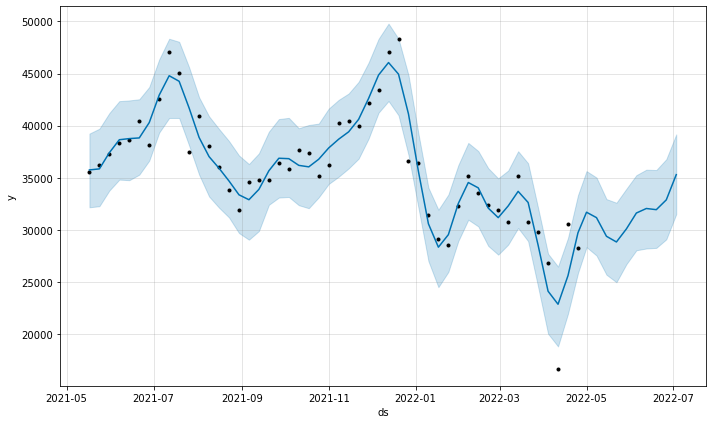

In [220]:
fcst = m.predict(future)
fig = m.plot(fcst)

In [239]:
m1 = Prophet(interval_width=0.99,weekly_seasonality=False , daily_seasonality=False, yearly_seasonality=False)
m1.fit(train[train['Z_WEEK_DATE'] >= '2022-01-01'][['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'}))
future1 = m1.make_future_dataframe(periods=10, freq = 'W')
fcst1 = m1.predict(future1)

INFO:prophet:n_changepoints greater than number of observations. Using 12.


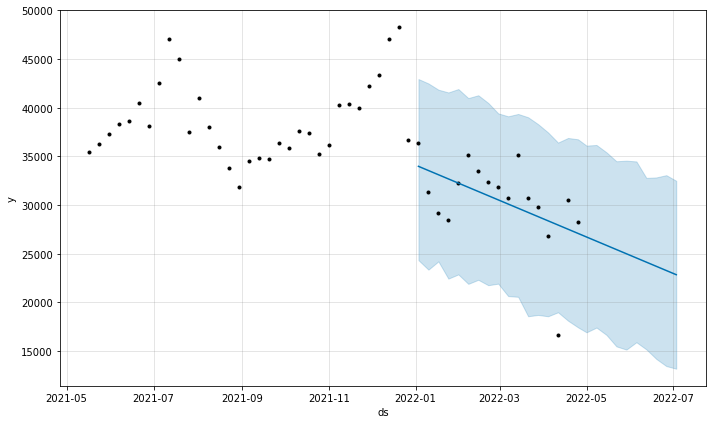

In [240]:
fig1 = m.plot(fcst1)

In [241]:
from neuralprophet import NeuralProphet

In [245]:
m_NP = NeuralProphet()
metrics= m_NP.fit(train[['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'}), freq="W")

INFO - (NP.df_utils._infer_frequency) - Major frequency W-MON corresponds to 98.0% of the data.
INFO:NP.df_utils:Major frequency W-MON corresponds to 98.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W
INFO - (NP.config.init_data_params) - Setting normalization to global as only one dataframe provided for training.
INFO:NP.config:Setting normalization to global as only one dataframe provided for training.
INFO - (NP.utils.set_auto_seasonalities) - Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO:NP.utils:Disabling yearly seasonality. Run NeuralProphet with yearly_seasonality=True to override this.
INFO - (NP.utils.set_auto_seasonalities) - Disabling weekly seasonality. Run NeuralProphet with weekly_seasonality=True to override this.
INFO:NP.utils:Disabling weekly seasonality. Run NeuralProphet with weekly_seasonal

  0%|          | 0/104 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.20E+00, min: 1.31E-01
INFO:NP.utils_torch:lr-range-test results: steep: 1.20E+00, min: 1.31E-01


  0%|          | 0/104 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.00E+01, min: 1.31E-01
INFO:NP.utils_torch:lr-range-test results: steep: 2.00E+01, min: 1.31E-01
INFO - (NP.forecaster._init_train_loader) - lr-range-test selected learning rate: 1.34E+00
INFO:NP.forecaster:lr-range-test selected learning rate: 1.34E+00
Epoch[868/868]: 100%|███| 868/868 [00:06<00:00, 143.74it/s, SmoothL1Loss=0.00391, MAE=1.87e+3, RMSE=2.64e+3, RegLoss=0]


In [252]:
forecast = m_NP.predict(train[['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'}))

INFO - (NP.df_utils._infer_frequency) - Major frequency W-MON corresponds to 98.0% of the data.
INFO:NP.df_utils:Major frequency W-MON corresponds to 98.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W
INFO - (NP.df_utils._infer_frequency) - Major frequency W-MON corresponds to 98.0% of the data.
INFO:NP.df_utils:Major frequency W-MON corresponds to 98.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W


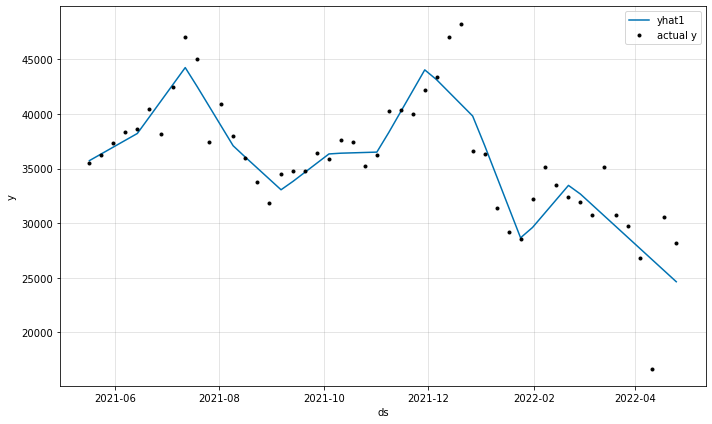

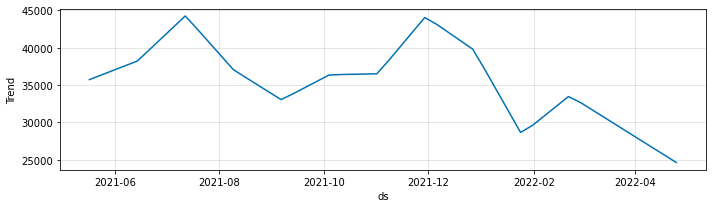

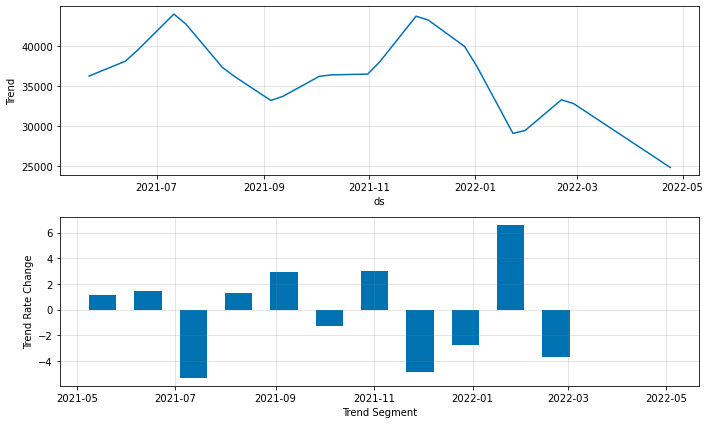

In [254]:
fig_forecast = m_NP.plot(forecast)
fig_components = m_NP.plot_components(forecast)
fig_model = m_NP.plot_parameters()

INFO - (NP.df_utils._infer_frequency) - Major frequency W-MON corresponds to 98.0% of the data.
INFO:NP.df_utils:Major frequency W-MON corresponds to 98.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W
INFO - (NP.df_utils._infer_frequency) - Major frequency W-SUN corresponds to 90.0% of the data.
INFO:NP.df_utils:Major frequency W-SUN corresponds to 90.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W
INFO - (NP.df_utils._infer_frequency) - Major frequency W-SUN corresponds to 90.0% of the data.
INFO:NP.df_utils:Major frequency W-SUN corresponds to 90.0% of the data.
INFO - (NP.df_utils._infer_frequency) - Defined frequency is equal to major frequency - W
INFO:NP.df_utils:Defined frequency is equal to major frequency - W


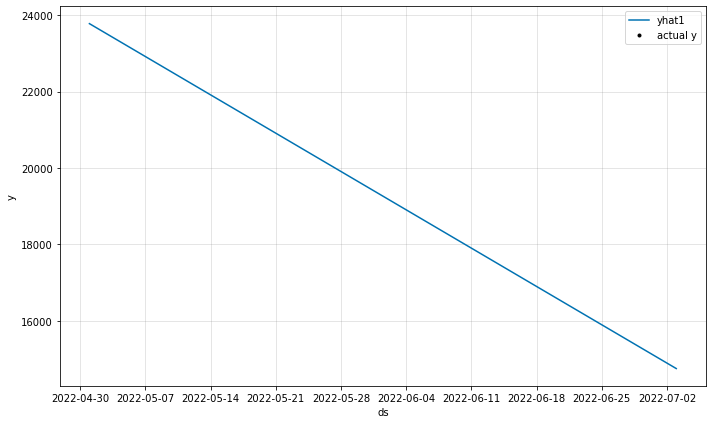

In [249]:
df_future = m_NP.make_future_dataframe(train[['Z_WEEK_DATE', 'Demanda']].groupby('Z_WEEK_DATE').sum().reset_index().rename(columns = {'Z_WEEK_DATE':'ds', 'Demanda':'y'}), periods=10)
forecast = m_NP.predict(df_future)
fig_forecast = m_NP.plot(forecast)

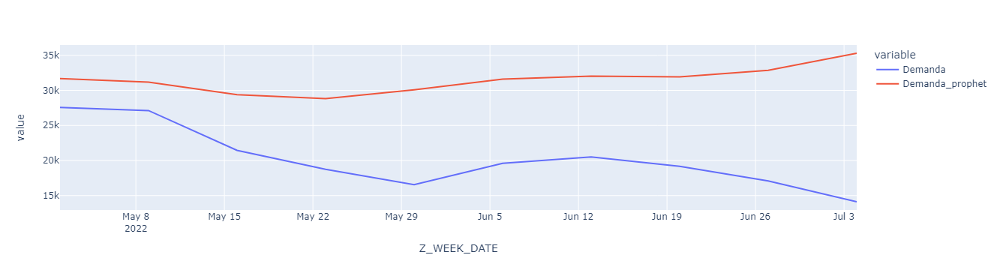

In [233]:
test['Demanda_tuned'] = test['Demanda']
test['Demanda_prophet'] = test['ratio']*test['yhat']/100 

test[['Z_WEEK_DATE', 'Demanda' , 'Demanda_prophet']].groupby(['Z_WEEK_DATE']).sum().reset_index()

graph = pd.melt(test[['Z_WEEK_DATE', 'Demanda' , 'Demanda_prophet']].groupby(['Z_WEEK_DATE']).sum().reset_index(), id_vars=['Z_WEEK_DATE'], value_vars=['Demanda', 'Demanda_prophet'],
)

fig = px.line(graph, x='Z_WEEK_DATE', y="value", color = 'variable')
fig.show()

In [431]:
#test_id=pd.read_csv('Resultado_Prophet_Por_ID.csv')

In [432]:
#test_id.loc[test_id['Demanda_pred'] <= 0, 'Demanda_pred'] = 0

In [433]:
#test_id

In [434]:
'''
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-02', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-02']['Demanda_pred']*0.87 #0.85
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-09', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-09']['Demanda_pred']*0.8
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-16', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-16']['Demanda_pred']*0.8

test_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-23', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-23']['Demanda_pred']*0.6
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-30', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-30']['Demanda_pred']*0.6
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-06', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-06']['Demanda_pred']*0.6
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-13', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-13']['Demanda_pred']*0.6

test_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-20', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-20']['Demanda_pred']*0.4 # Cambiar a 0.3
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-27', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-27']['Demanda_pred']*0.4 # Cambiar a 0.3
test_id.loc[test_id['Z_WEEK_DATE'] == '2022-07-04', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-07-04']['Demanda_pred']*0.40 # Cambiar a 0.3
'''

"\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-02', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-02']['Demanda_pred']*0.87 #0.85\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-09', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-09']['Demanda_pred']*0.8\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-16', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-16']['Demanda_pred']*0.8\n\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-23', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-23']['Demanda_pred']*0.6\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-05-30', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-05-30']['Demanda_pred']*0.6\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-06', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-06']['Demanda_pred']*0.6\ntest_id.loc[test_id['Z_WEEK_DATE'] == '2022-06-13', 'Demanda_pred'] = test_id[test_id['Z_WEEK_DATE'] == '2022-06-13']['Demanda_pred']*0.6\n\ntest_id.loc[t

In [435]:
#test = test.merge(test_id, on = ['Z_WEEK_DATE', 'ID'], how = 'left')

#test['DIFF'] = abs(test['Demanda_pred'] - test['Demanda_tuned'])

In [436]:
#sns.boxplot(data = test, x= 'DIFF')

In [437]:
#sns.boxplot(data = test[test['Demanda_tuned'] != 0],  x= 'Demanda_tuned')

In [438]:
#test.loc[(test['DIFF'] <= 20) & (test['DIFF'] >= 5) & (test['Demanda_pred'] > test['Demanda']) & (test['ratio'] >= 0.0111)]

In [439]:
#test.loc[(test['DIFF'] <= 20) & (test['DIFF'] >= 10) & (test['Demanda_pred'] < test['Demanda']) & (test['ratio'] >= 0.0111)]

In [440]:
#test.loc[(test['DIFF'] <= 20) & (test['DIFF'] >= 5) & (test['Demanda_pred'] > test['Demanda']) & (test['ratio'] >= 0.0111), 'Demanda'] = test[(test['DIFF'] <= 20) & (test['DIFF'] >= 5) & (test['Demanda_pred'] <= test['Demanda']) & (test['ratio'] >= 0.0111)]['Demanda_tuned']*0.5 + test[(test['DIFF'] <= 20) & (test['DIFF'] >= 5) & (test['Demanda_pred'] <= test['Demanda']) & (test['ratio'] >= 0.0111)]['Demanda_pred']*0.5  

In [441]:
''' 
submit = test.copy()
#submit['Demanda'] = model.predict(X_test)
#submit.loc[submit['Demanda'] < 0, 'Demanda'] = 0 
reverse_mapping_file = '..\\utils\\reverse_dict_mapping_list.txt'

with open(reverse_mapping_file, 'rb') as f:
    reverse_mapping = pickle.load( f)

i=0
for column in descriptive_columns:
    submit[column] = submit[column].map(reverse_mapping[i])
    i+=1
    
submit['ID'] = submit['Z_MODELO'] + '|' + submit['Z_PUNTO_VENTA'] + '|' + submit['Z_GAMA'] + '|' + submit['Z_WEEK']
submission = submit[['ID','Demanda']].groupby('ID').sum().reset_index()
submission[['ID', 'Demanda']].to_csv('Submission_24.csv', index = False, sep = ',')
'''

" \nsubmit = test.copy()\n#submit['Demanda'] = model.predict(X_test)\n#submit.loc[submit['Demanda'] < 0, 'Demanda'] = 0 \nreverse_mapping_file = '..\\utils\\reverse_dict_mapping_list.txt'\n\nwith open(reverse_mapping_file, 'rb') as f:\n    reverse_mapping = pickle.load( f)\n\ni=0\nfor column in descriptive_columns:\n    submit[column] = submit[column].map(reverse_mapping[i])\n    i+=1\n    \nsubmit['ID'] = submit['Z_MODELO'] + '|' + submit['Z_PUNTO_VENTA'] + '|' + submit['Z_GAMA'] + '|' + submit['Z_WEEK']\nsubmission = submit[['ID','Demanda']].groupby('ID').sum().reset_index()\nsubmission[['ID', 'Demanda']].to_csv('Submission_24.csv', index = False, sep = ',')\n"